In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [ ]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            
            nn.Linear(z_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.ReLU(inplace=True),
            
            nn.Linear(hidden_dim, hidden_dim * 2),
            nn.BatchNorm1d(hidden_dim * 2),
            nn.ReLU(inplace=True),

            nn.Linear(hidden_dim * 2, hidden_dim * 4),
            nn.BatchNorm1d(hidden_dim * 4),
            nn.ReLU(inplace=True),

            nn.Linear(hidden_dim * 4, hidden_dim * 8),
            nn.BatchNorm1d(hidden_dim * 8),
            nn.ReLU(inplace=True),

            nn.Linear(hidden_dim * 8, im_dim),
            nn.BatchNorm1d(im_dim),
            nn.ReLU(inplace=True),

            nn.Sigmoid()
        
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
  
  

In [ ]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            
            nn.Linear(im_dim, hidden_dim * 4),
            nn.LeakyReLU(0.2),

            nn.Linear(hidden_dim * 4, hidden_dim * 2),
            nn.LeakyReLU(0.2),

            nn.Linear(hidden_dim * 2, hidden_dim),
            nn.LeakyReLU(0.2),

            nn.Linear(hidden_dim,1)
            
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)

In [ ]:
def get_noise(n_samples, z_dim, device='cpu'):
  return torch.randn(n_samples, z_dim, device = device)

In [ ]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [ ]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

Epoch 1, step 500: Generator loss: 2.72073012650013, discriminator loss: 0.27687285088375213


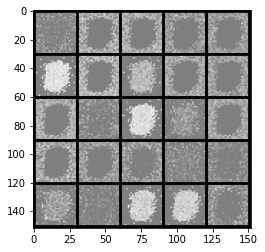

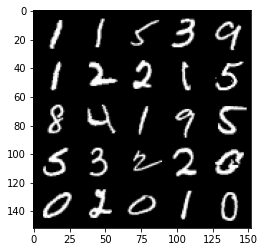

Epoch 2, step 1000: Generator loss: 6.4701732149124185, discriminator loss: 0.010597155134659265


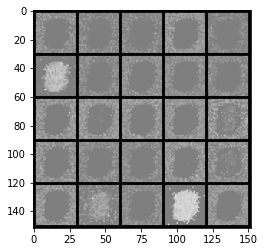

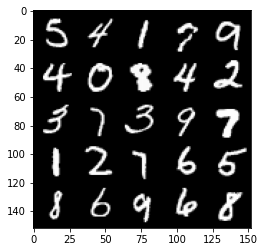

Epoch 3, step 1500: Generator loss: 7.8783533897399876, discriminator loss: 0.002294372126692902


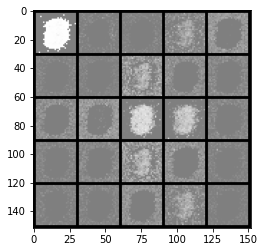

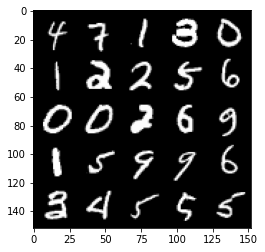

Epoch 4, step 2000: Generator loss: 8.749164205551146, discriminator loss: 0.0009473563451902


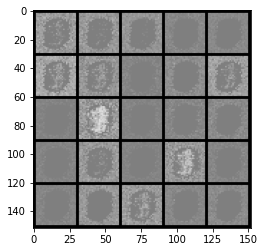

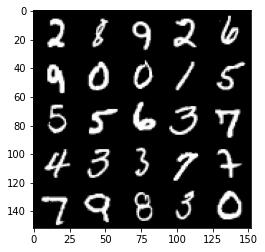

Epoch 5, step 2500: Generator loss: 9.435088443756104, discriminator loss: 0.00048811542391194955


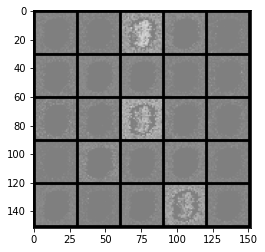

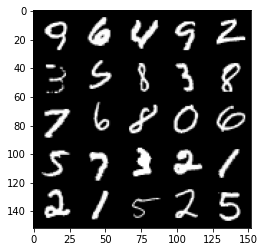

Epoch 6, step 3000: Generator loss: 10.009374284744263, discriminator loss: 0.00029064013363677075


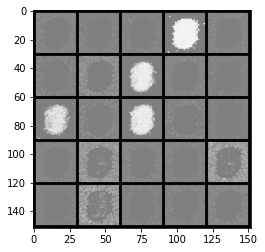

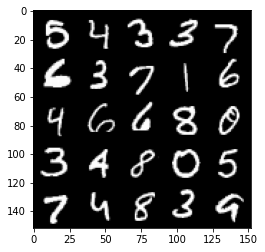

Epoch 7, step 3500: Generator loss: 10.539362001419068, discriminator loss: 0.00018050424628745536


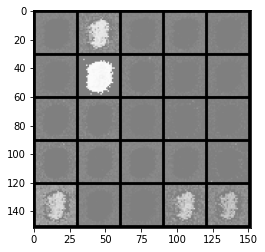

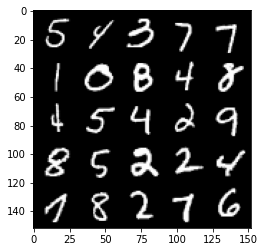

Epoch 8, step 4000: Generator loss: 11.011195701599117, discriminator loss: 0.00012054039622307754


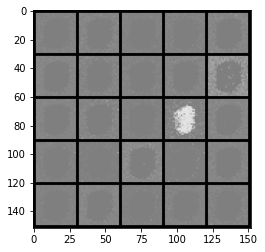

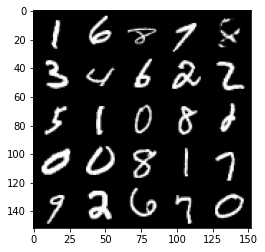

Epoch 9, step 4500: Generator loss: 11.448125007629399, discriminator loss: 8.181671364218344e-05


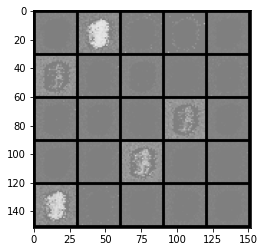

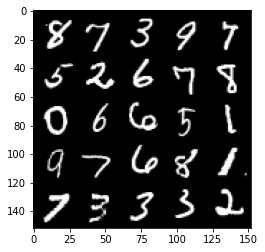

Epoch 10, step 5000: Generator loss: 11.858888721466062, discriminator loss: 5.708385119214659e-05


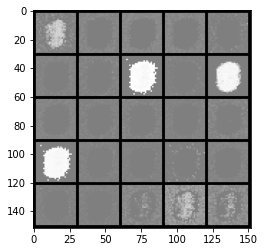

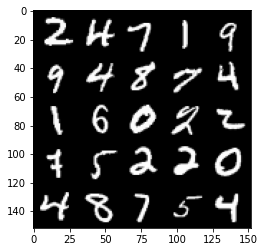

Epoch 11, step 5500: Generator loss: 12.24749369430543, discriminator loss: 4.096566440784953e-05


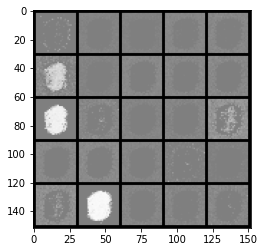

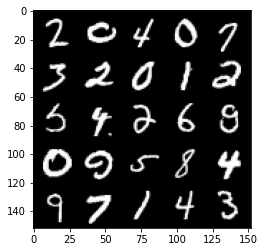

Epoch 12, step 6000: Generator loss: 12.616659492492676, discriminator loss: 2.844427269246807e-05


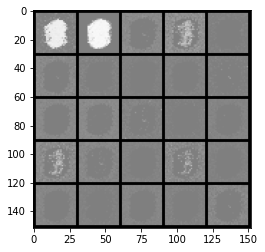

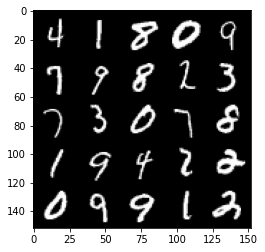

Epoch 13, step 6500: Generator loss: 12.95705858802795, discriminator loss: 2.09503058094924e-05


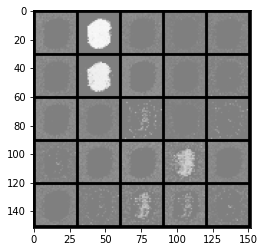

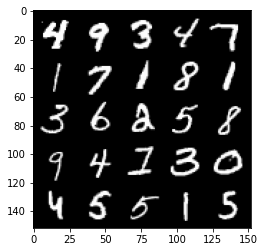

Epoch 14, step 7000: Generator loss: 13.292564422607436, discriminator loss: 1.5172939203694112e-05


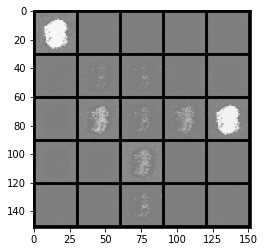

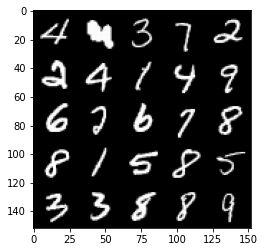

Epoch 15, step 7500: Generator loss: 13.625949144363394, discriminator loss: 1.0952439031370887e-05


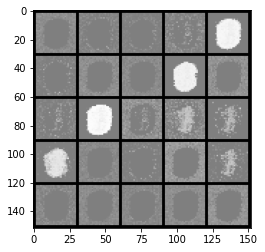

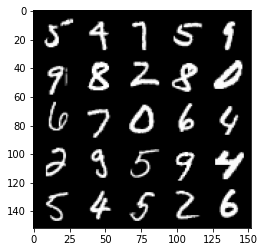

Epoch 17, step 8000: Generator loss: 13.934386186599733, discriminator loss: 8.181769727798378e-06


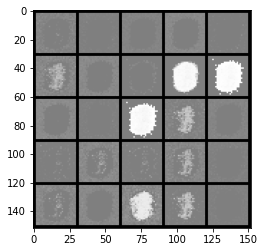

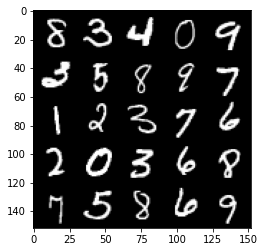

Epoch 18, step 8500: Generator loss: 14.247082395553583, discriminator loss: 6.0834240348413e-06


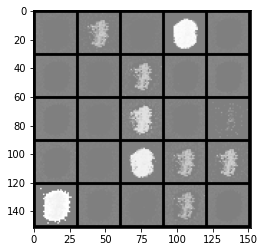

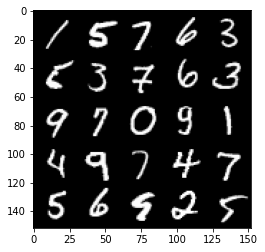

Epoch 19, step 9000: Generator loss: 14.562663560867314, discriminator loss: 4.252709334537029e-06


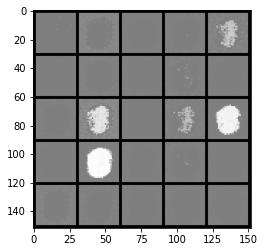

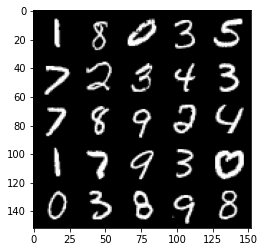

Epoch 20, step 9500: Generator loss: 14.865474016189578, discriminator loss: 3.495608471723698e-06


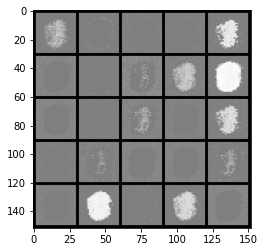

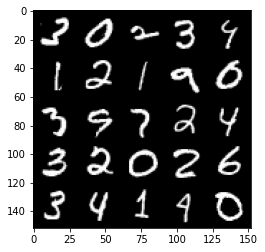

Epoch 21, step 10000: Generator loss: 15.180811429977428, discriminator loss: 2.41506402534242e-06


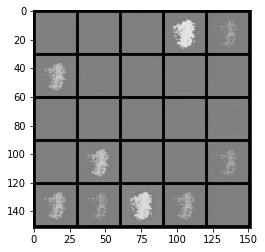

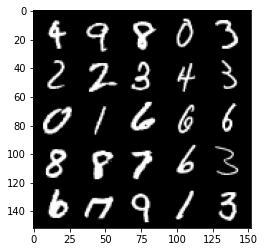

Epoch 22, step 10500: Generator loss: 15.461937198638909, discriminator loss: 1.9271226577188824e-06


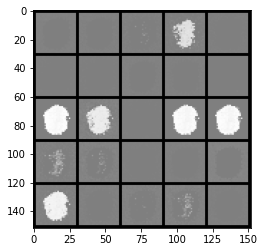

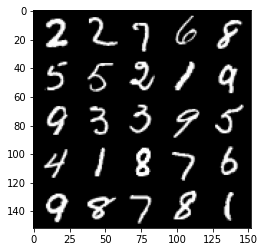

Epoch 23, step 11000: Generator loss: 15.790332235336304, discriminator loss: 1.3789438088167574e-06


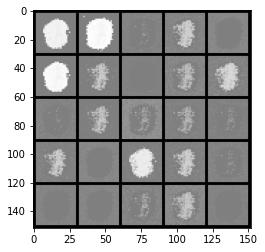

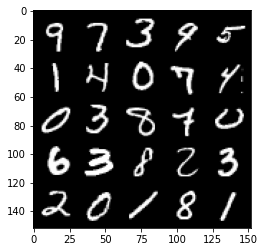

Epoch 24, step 11500: Generator loss: 16.093223794937128, discriminator loss: 1.0367322464048816e-06


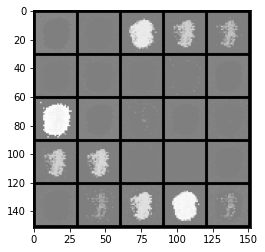

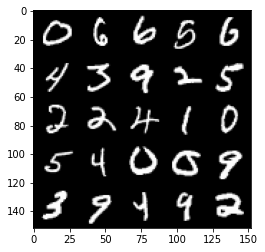

Epoch 25, step 12000: Generator loss: 16.387154617309566, discriminator loss: 8.273272608221307e-07


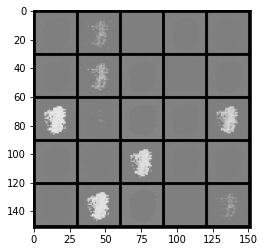

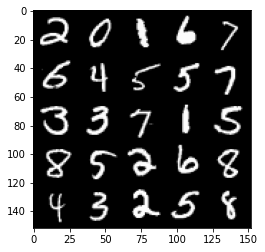

Epoch 26, step 12500: Generator loss: 16.69356849288941, discriminator loss: 5.828063869870452e-07


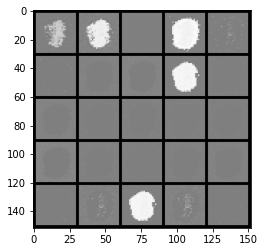

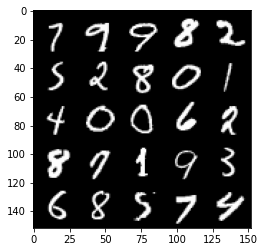

Epoch 27, step 13000: Generator loss: 16.99008140945435, discriminator loss: 4.522217544149497e-07


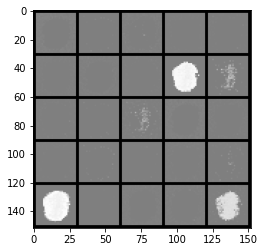

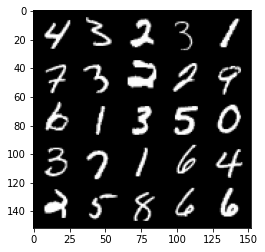

Epoch 28, step 13500: Generator loss: 17.285758529663084, discriminator loss: 3.329997434278204e-07


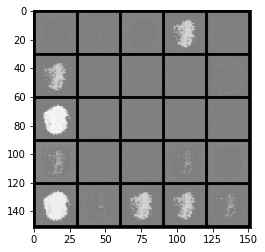

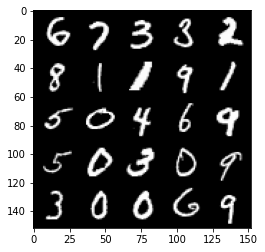

Epoch 29, step 14000: Generator loss: 17.570809047698972, discriminator loss: 2.524427092396309e-07


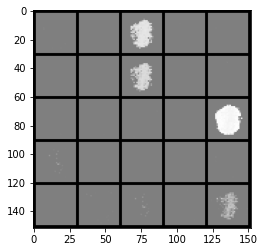

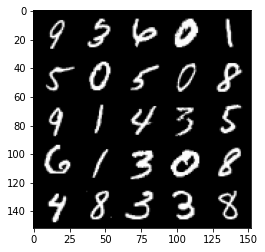

Epoch 30, step 14500: Generator loss: 17.86696730804444, discriminator loss: 1.9906933692581688e-07


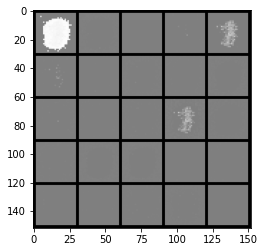

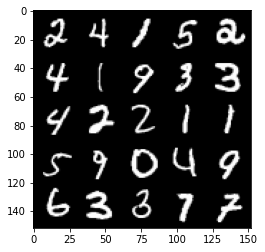

Epoch 31, step 15000: Generator loss: 18.156043334960934, discriminator loss: 1.49420188538585e-07


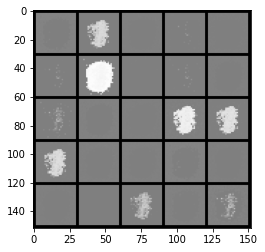

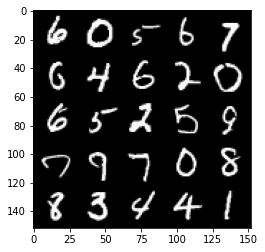

Epoch 33, step 15500: Generator loss: 18.444990665435785, discriminator loss: 1.155616839279006e-07


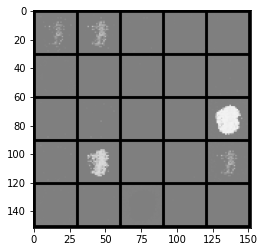

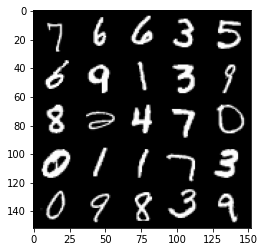

Epoch 34, step 16000: Generator loss: 18.71774923706058, discriminator loss: 8.623603586865864e-08


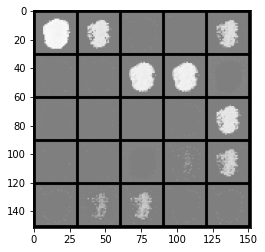

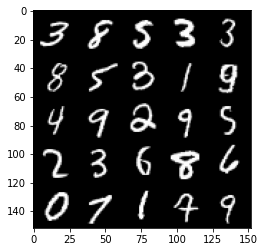

Epoch 35, step 16500: Generator loss: 19.002561100006098, discriminator loss: 6.800264707496058e-08


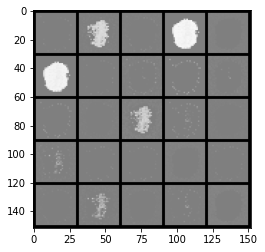

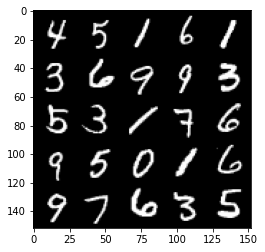

Epoch 36, step 17000: Generator loss: 19.270048065185545, discriminator loss: 5.7245084779333675e-08


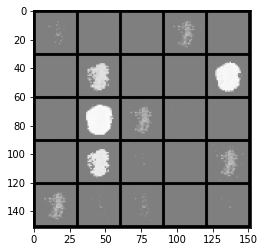

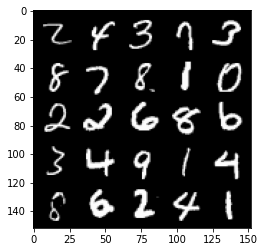

Epoch 37, step 17500: Generator loss: 19.54337675094606, discriminator loss: 4.198319161974331e-08


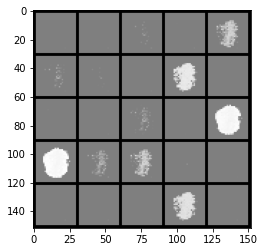

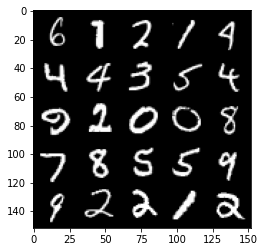

Epoch 38, step 18000: Generator loss: 19.794505512237535, discriminator loss: 3.398300907153651e-08


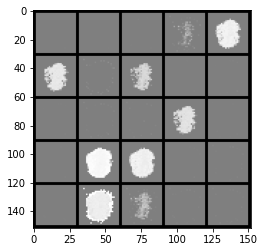

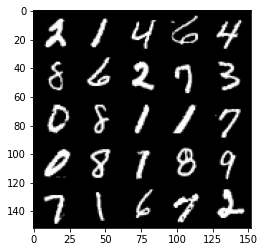

Epoch 39, step 18500: Generator loss: 20.054952541351305, discriminator loss: 2.4225616885142923e-08


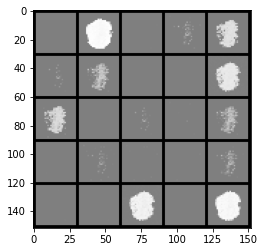

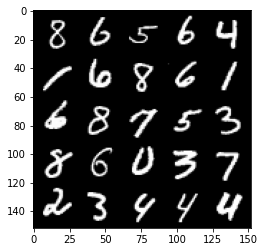

Epoch 40, step 19000: Generator loss: 20.300909515380877, discriminator loss: 2.0862630709550514e-08


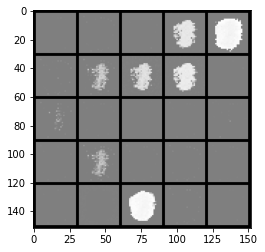

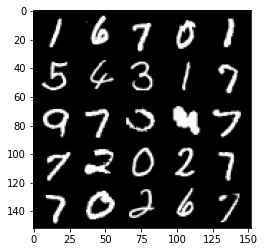

Epoch 41, step 19500: Generator loss: 20.5412547645569, discriminator loss: 1.7317151085327615e-08


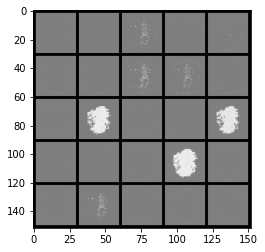

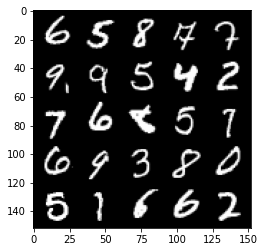

Epoch 42, step 20000: Generator loss: 20.76722735214233, discriminator loss: 1.2333716783552469e-08


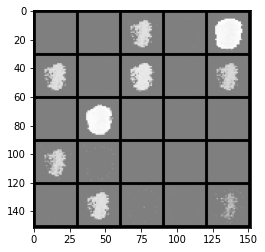

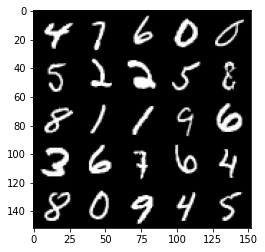

Epoch 43, step 20500: Generator loss: 20.981487792968743, discriminator loss: 1.0960022769235248e-08


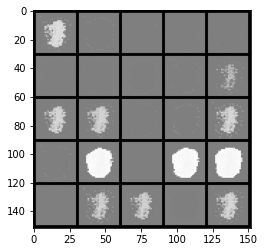

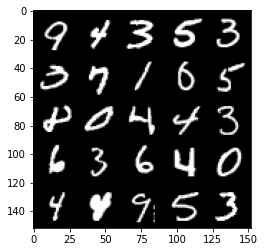

Epoch 44, step 21000: Generator loss: 21.19326613998413, discriminator loss: 8.511301860358882e-09


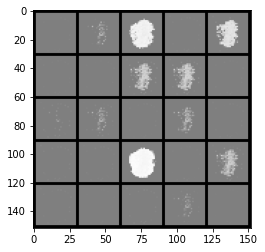

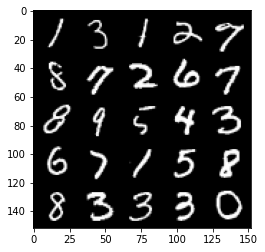

Epoch 45, step 21500: Generator loss: 21.395124092102048, discriminator loss: 7.915889010556858e-09


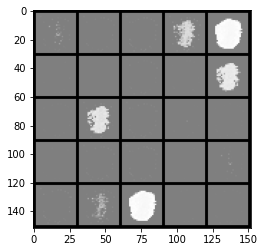

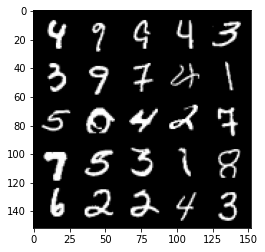

Epoch 46, step 22000: Generator loss: 21.5931255722046, discriminator loss: 5.6242322650224155e-09


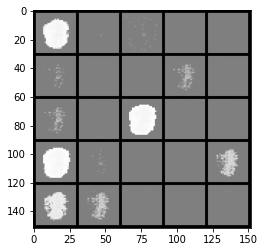

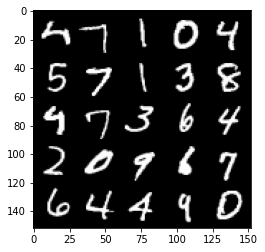

Epoch 47, step 22500: Generator loss: 21.784756729125967, discriminator loss: 4.70378178785148e-09


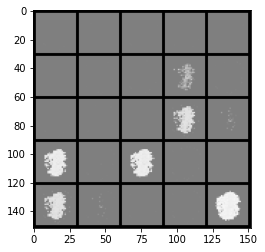

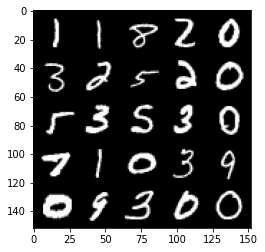

Epoch 49, step 23000: Generator loss: 21.95180787658692, discriminator loss: 4.0124347377435e-09


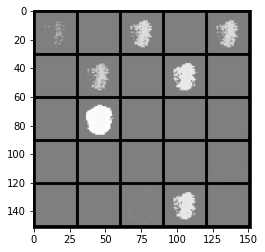

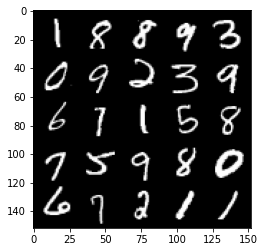

Epoch 50, step 23500: Generator loss: 22.125969615936267, discriminator loss: 3.630283877231753e-09


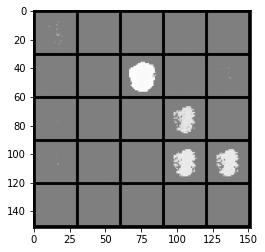

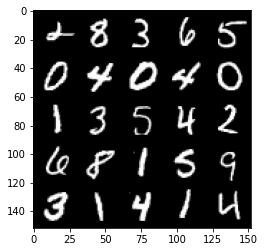

Epoch 51, step 24000: Generator loss: 22.29686224746703, discriminator loss: 2.893301919382205e-09


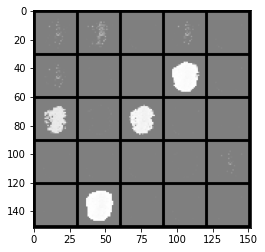

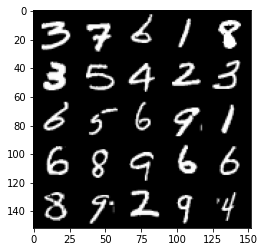

Epoch 52, step 24500: Generator loss: 22.454906219482407, discriminator loss: 2.4679985862752283e-09


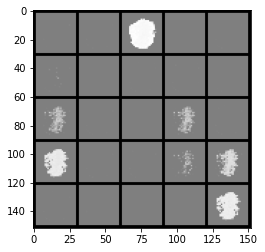

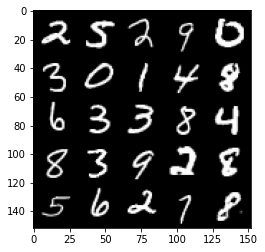

Epoch 53, step 25000: Generator loss: 22.611166191101063, discriminator loss: 2.2252352248619557e-09


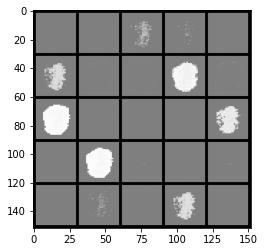

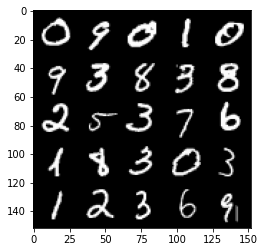

Epoch 54, step 25500: Generator loss: 22.756580417633053, discriminator loss: 1.8300454731612339e-09


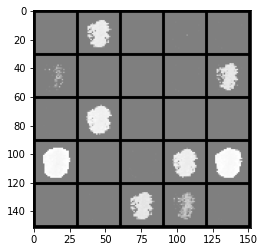

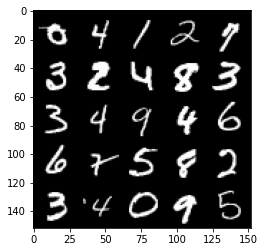

Epoch 55, step 26000: Generator loss: 22.905132514953603, discriminator loss: 1.6521636833077833e-09


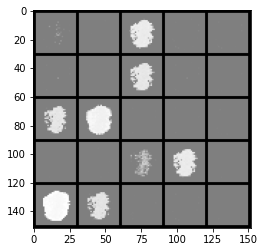

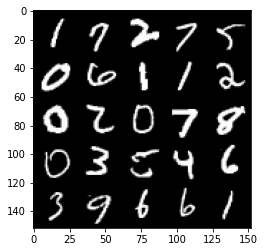

Epoch 56, step 26500: Generator loss: 23.04323614501951, discriminator loss: 1.3718358787828672e-09


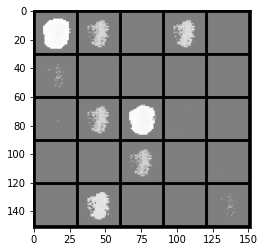

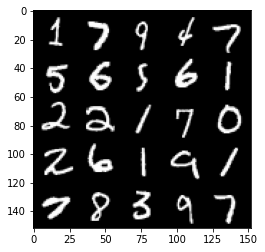

Epoch 57, step 27000: Generator loss: 23.17727926635743, discriminator loss: 1.2880174129481496e-09


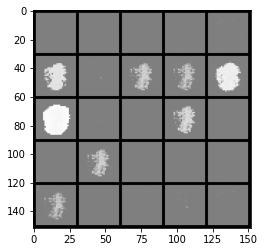

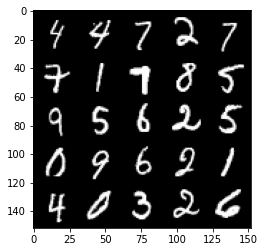

Epoch 58, step 27500: Generator loss: 23.311000534057612, discriminator loss: 9.722996497929504e-10


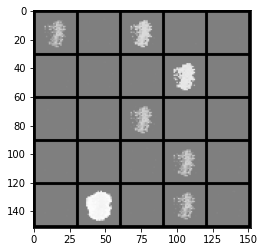

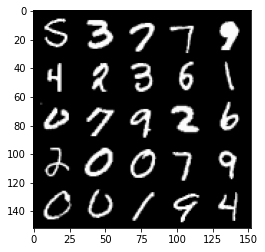

Epoch 59, step 28000: Generator loss: 23.434510189056386, discriminator loss: 8.859972157049249e-10


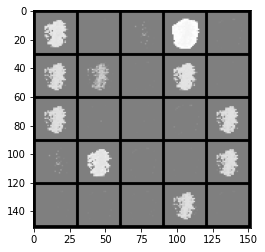

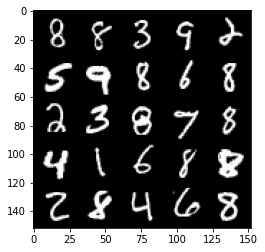

Epoch 60, step 28500: Generator loss: 23.55755599975586, discriminator loss: 7.969010279440518e-10


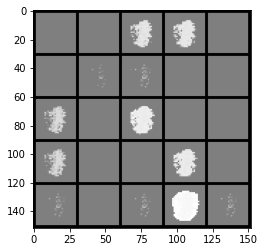

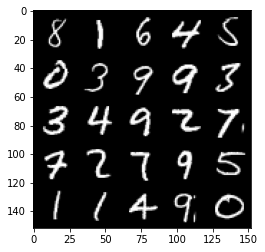

Epoch 61, step 29000: Generator loss: 23.674025794982914, discriminator loss: 7.466096075825482e-10


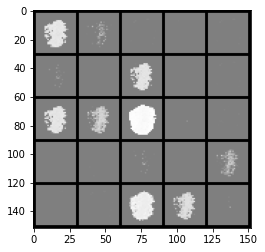

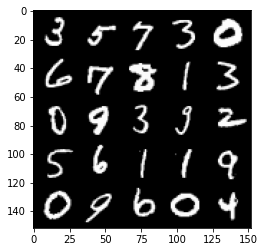

Epoch 62, step 29500: Generator loss: 23.7851490135193, discriminator loss: 6.519252987446929e-10


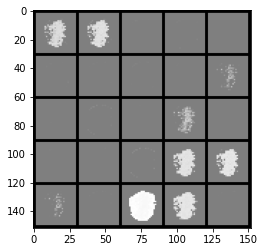

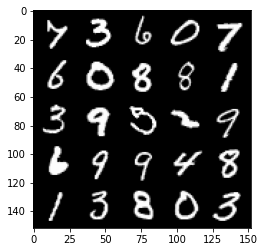

Epoch 63, step 30000: Generator loss: 23.898659381866473, discriminator loss: 5.209193848498825e-10


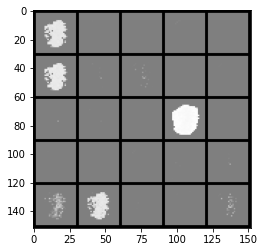

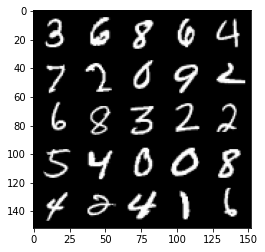

Epoch 65, step 30500: Generator loss: 24.003432308197024, discriminator loss: 4.85218748402793e-10


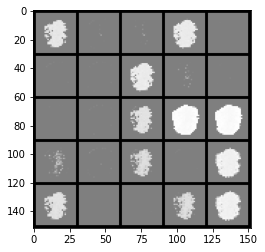

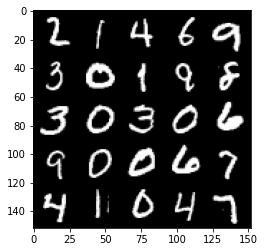

Epoch 66, step 31000: Generator loss: 24.103866645813003, discriminator loss: 4.3027077017976343e-10


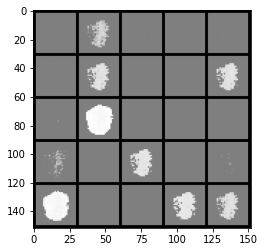

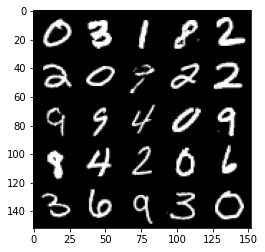

Epoch 67, step 31500: Generator loss: 24.19789687728881, discriminator loss: 4.1381742471591204e-10


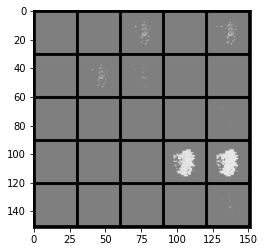

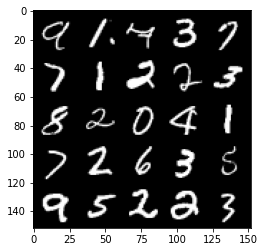

Epoch 68, step 32000: Generator loss: 24.2875392150879, discriminator loss: 3.7718542800213567e-10


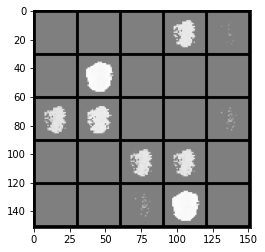

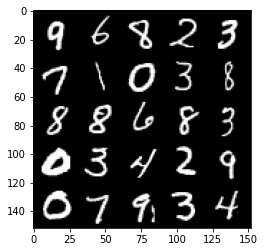

Epoch 69, step 32500: Generator loss: 24.372167301177992, discriminator loss: 3.5762769606817447e-10


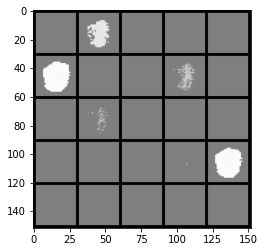

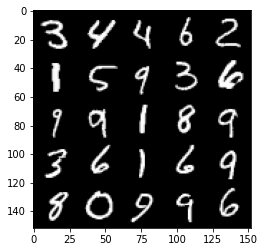

Epoch 70, step 33000: Generator loss: 24.453800487518283, discriminator loss: 2.356245189516491e-10


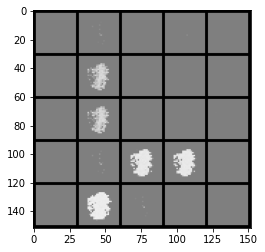

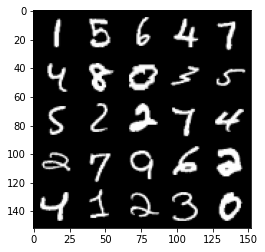

Epoch 71, step 33500: Generator loss: 24.532025962829582, discriminator loss: 3.0826761004965055e-10


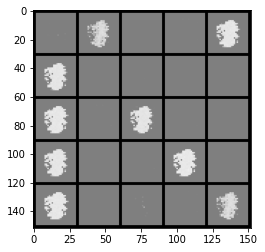

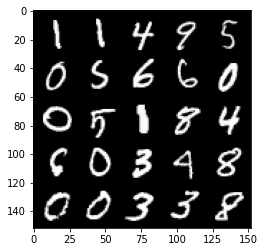

Epoch 72, step 34000: Generator loss: 24.606351531982416, discriminator loss: 2.1699809066300074e-10


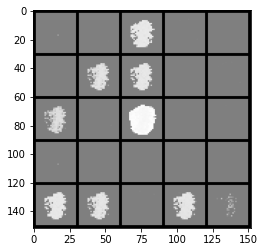

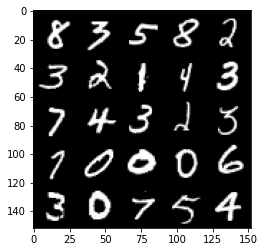

Epoch 73, step 34500: Generator loss: 24.67482808303834, discriminator loss: 2.756713732288139e-10


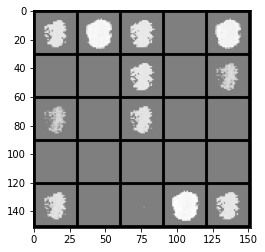

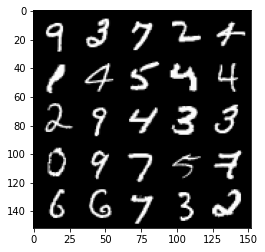

Epoch 74, step 35000: Generator loss: 24.740910705566407, discriminator loss: 1.9464635042654144e-10


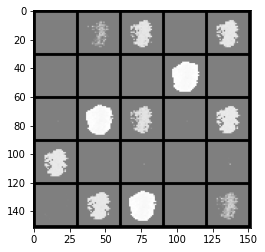

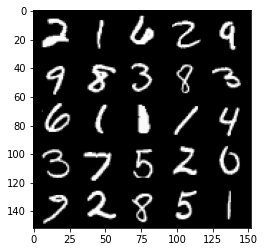

Epoch 75, step 35500: Generator loss: 24.79970069503787, discriminator loss: 2.0458045385529635e-10


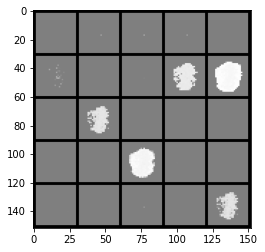

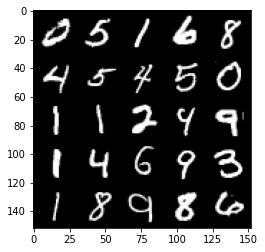

Epoch 76, step 36000: Generator loss: 24.857744682311985, discriminator loss: 1.8160783832321665e-10


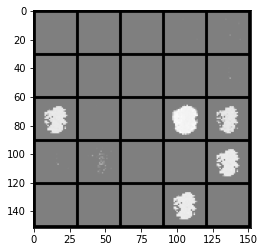

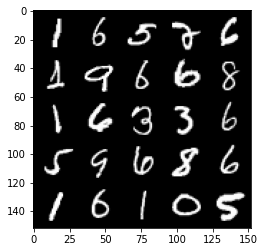

Epoch 77, step 36500: Generator loss: 24.913486549377424, discriminator loss: 1.750885862961126e-10


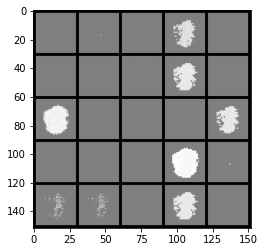

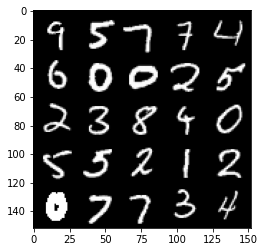

Epoch 78, step 37000: Generator loss: 24.96661014556887, discriminator loss: 1.7974519572749863e-10


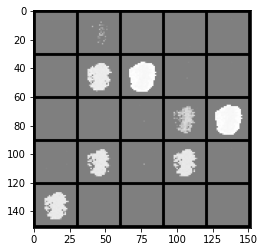

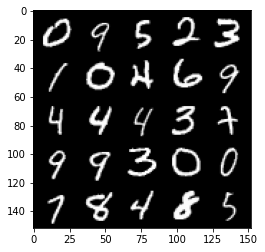

Epoch 79, step 37500: Generator loss: 25.015725093841514, discriminator loss: 1.6763801552466257e-10


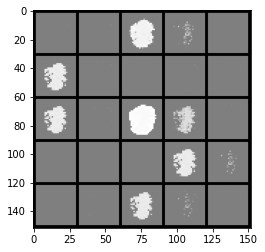

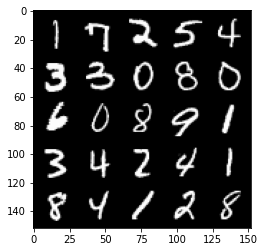

Epoch 81, step 38000: Generator loss: 25.063320976257344, discriminator loss: 1.5553082644004238e-10


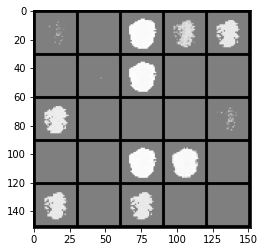

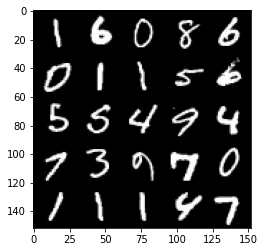

Epoch 82, step 38500: Generator loss: 25.109354572296148, discriminator loss: 1.4000879017261874e-10


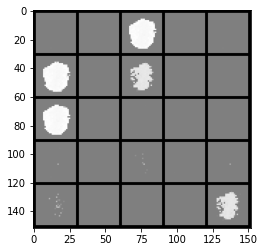

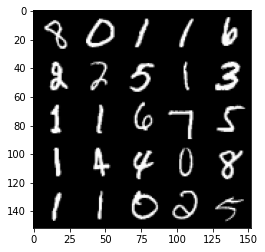

Epoch 83, step 39000: Generator loss: 25.15184548950194, discriminator loss: 1.5646215145714843e-10


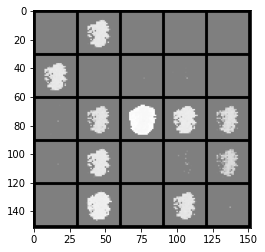

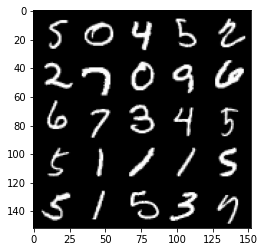

Epoch 84, step 39500: Generator loss: 25.19471062469481, discriminator loss: 1.2945380856166376e-10


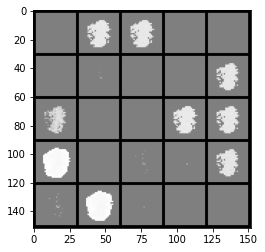

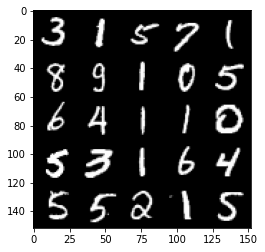

Epoch 85, step 40000: Generator loss: 25.234021774292, discriminator loss: 1.080333889014185e-10


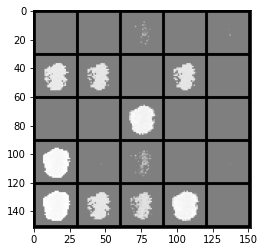

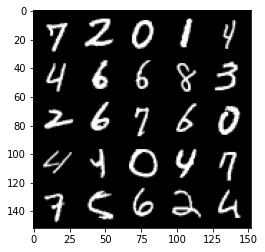

Epoch 86, step 40500: Generator loss: 25.27233664321897, discriminator loss: 1.2697027923502806e-10


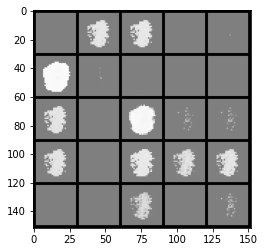

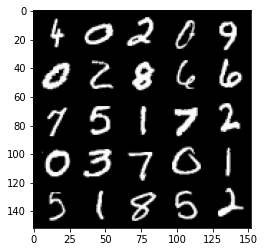

Epoch 87, step 41000: Generator loss: 25.308720760345437, discriminator loss: 1.1269000804725601e-10


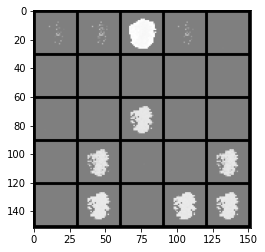

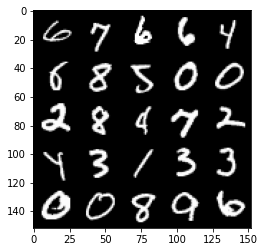

Epoch 88, step 41500: Generator loss: 25.343770759582505, discriminator loss: 1.1610485345370241e-10


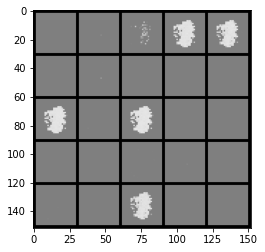

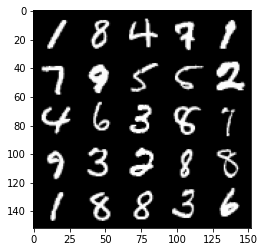

Epoch 89, step 42000: Generator loss: 25.376639957427976, discriminator loss: 8.692342223781682e-11


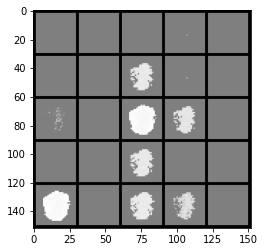

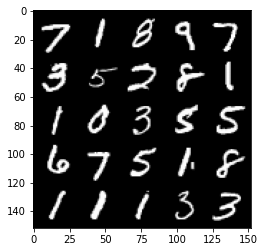

Epoch 90, step 42500: Generator loss: 25.408489730834958, discriminator loss: 1.1175868414037287e-10


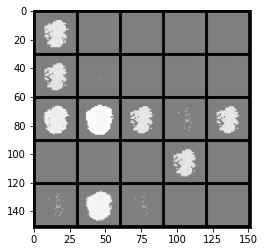

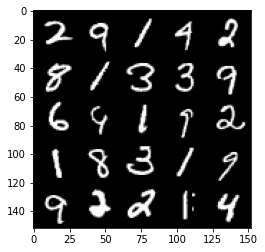

Epoch 91, step 43000: Generator loss: 25.43864694213868, discriminator loss: 9.778885035061082e-11


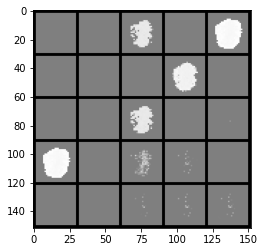

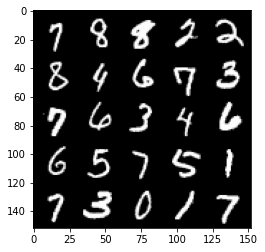

Epoch 92, step 43500: Generator loss: 25.468736083984364, discriminator loss: 1.0430810504225012e-10


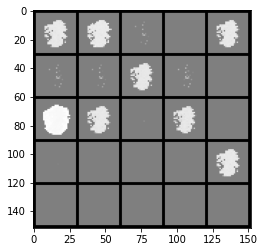

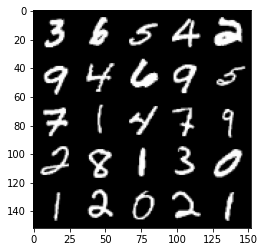

Epoch 93, step 44000: Generator loss: 25.498670902252176, discriminator loss: 9.49948833484094e-11


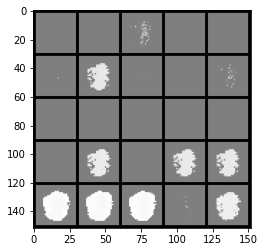

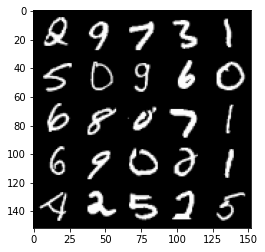

Epoch 94, step 44500: Generator loss: 25.526661327362067, discriminator loss: 8.195636957974984e-11


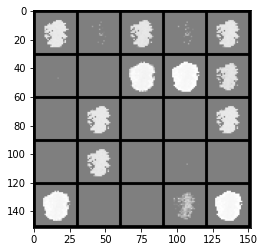

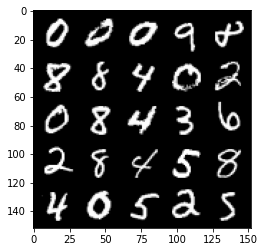

Epoch 95, step 45000: Generator loss: 25.553915264129675, discriminator loss: 8.381901550613696e-11


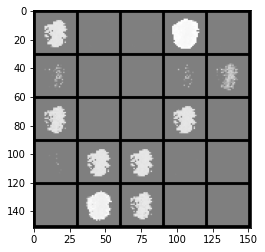

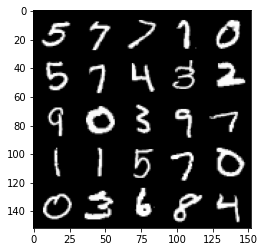

Epoch 97, step 45500: Generator loss: 25.580644615173338, discriminator loss: 7.916240540861709e-11


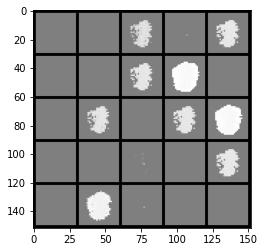

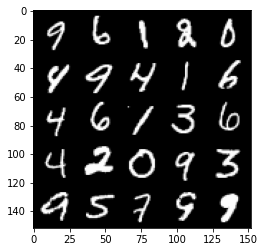

Epoch 98, step 46000: Generator loss: 25.606527355194117, discriminator loss: 7.264314816346485e-11


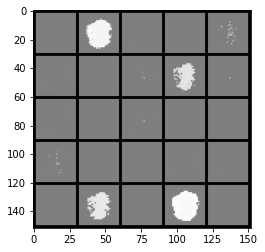

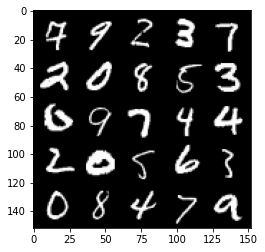

Epoch 99, step 46500: Generator loss: 25.63012596893311, discriminator loss: 8.754430669277726e-11


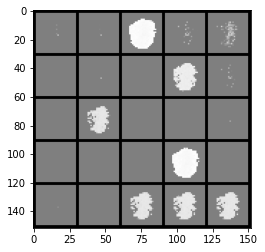

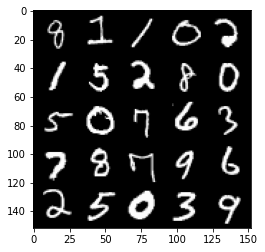

Epoch 100, step 47000: Generator loss: 25.65331201171876, discriminator loss: 7.450579148082781e-11


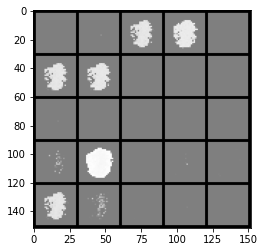

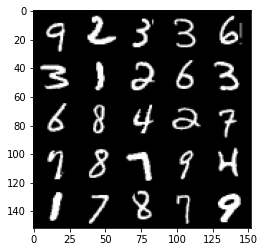

Epoch 101, step 47500: Generator loss: 25.676644893646245, discriminator loss: 7.450579359025157e-11


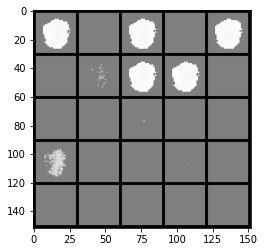

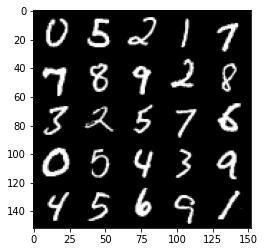

Epoch 102, step 48000: Generator loss: 25.69923732757568, discriminator loss: 6.42612476564608e-11


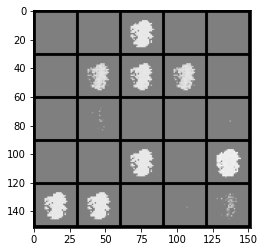

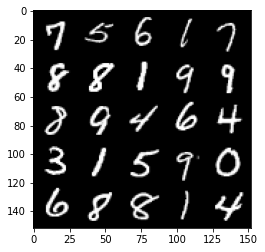

Epoch 103, step 48500: Generator loss: 25.721317165374757, discriminator loss: 8.195637196672934e-11


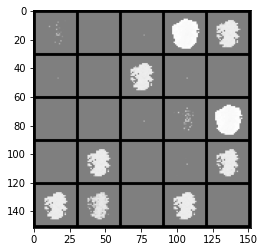

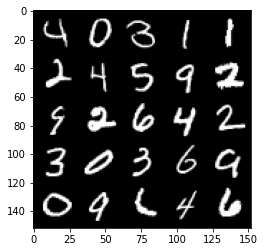

Epoch 104, step 49000: Generator loss: 25.743104732513427, discriminator loss: 6.146727976608089e-11


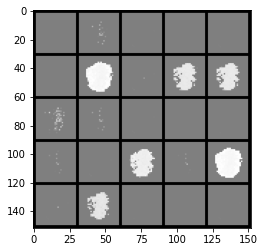

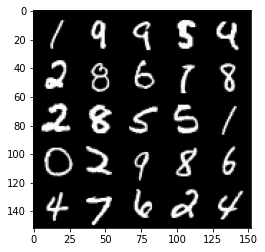

Epoch 105, step 49500: Generator loss: 25.764312488555923, discriminator loss: 5.774199152153158e-11


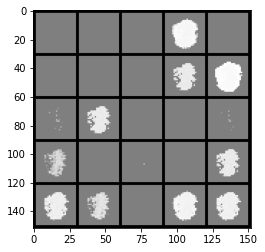

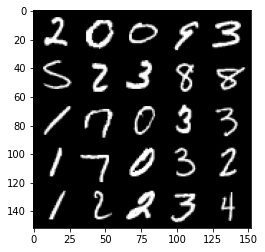

Epoch 106, step 50000: Generator loss: 25.784658332824698, discriminator loss: 5.49480221323506e-11


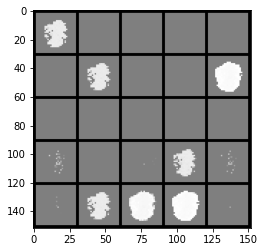

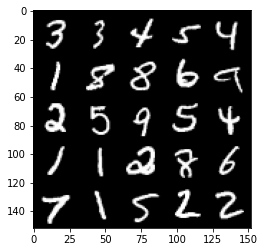

Epoch 107, step 50500: Generator loss: 25.804882072448734, discriminator loss: 6.984918199393064e-11


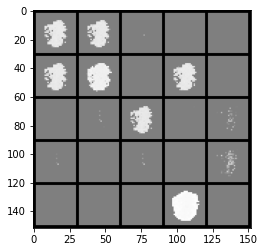

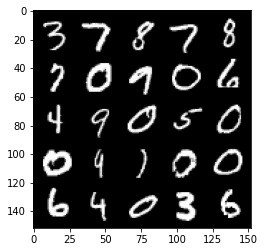

Epoch 108, step 51000: Generator loss: 25.824212100982656, discriminator loss: 5.96046348944057e-11


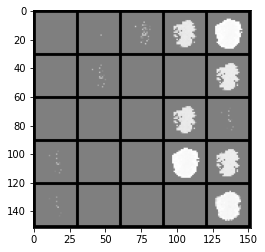

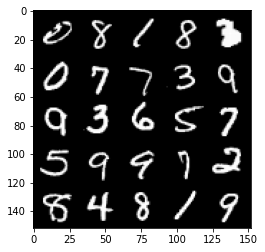

Epoch 109, step 51500: Generator loss: 25.84323113250731, discriminator loss: 5.401670077898045e-11


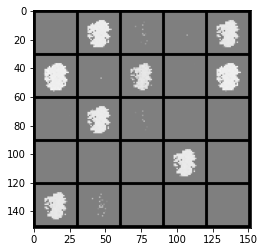

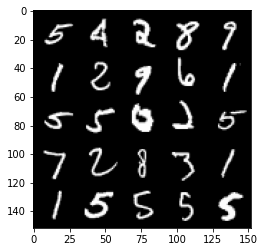

Epoch 110, step 52000: Generator loss: 25.861867733001677, discriminator loss: 5.681066878038265e-11


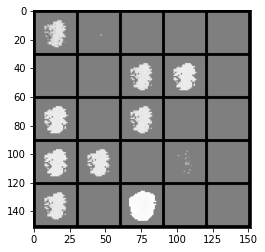

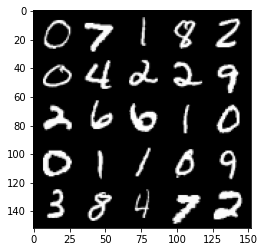

Epoch 111, step 52500: Generator loss: 25.879844726562514, discriminator loss: 5.5879346316789465e-11


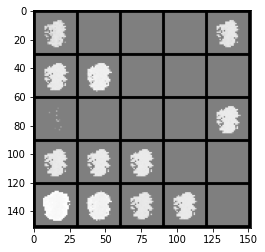

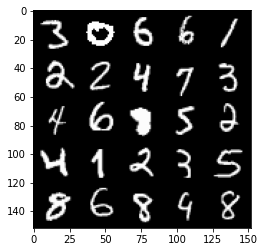

Epoch 113, step 53000: Generator loss: 25.897889957428, discriminator loss: 5.5879345983722555e-11


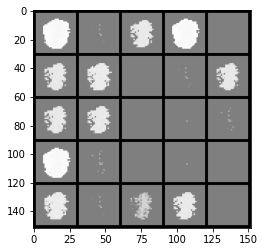

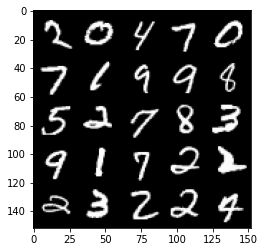

Epoch 114, step 53500: Generator loss: 25.914686065673838, discriminator loss: 5.215405651792791e-11


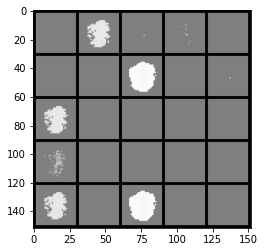

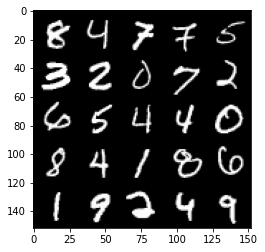

Epoch 115, step 54000: Generator loss: 25.930807071685773, discriminator loss: 5.401670133409196e-11


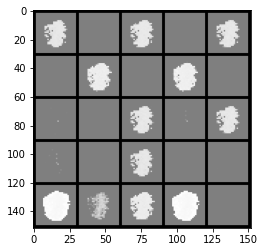

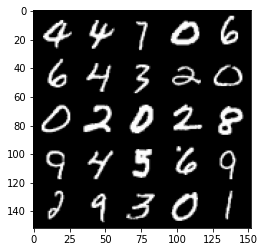

Epoch 116, step 54500: Generator loss: 25.947328689575233, discriminator loss: 5.0291412423408813e-11


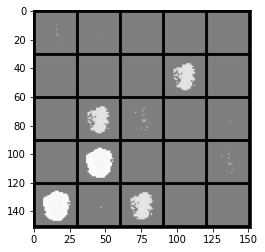

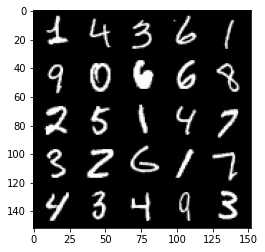

Epoch 117, step 55000: Generator loss: 25.963664878845233, discriminator loss: 5.122273449842393e-11


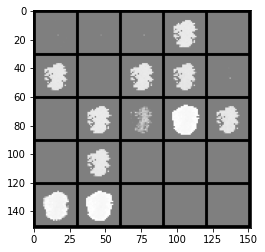

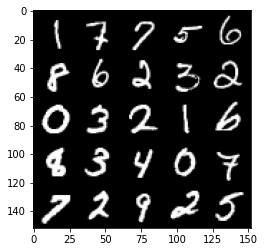

Epoch 118, step 55500: Generator loss: 25.979644123077378, discriminator loss: 4.842876732968902e-11


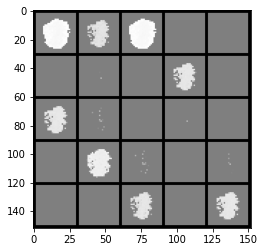

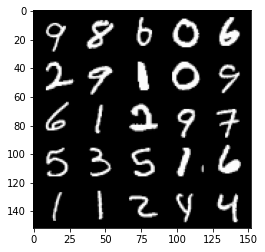

Epoch 119, step 56000: Generator loss: 25.995421730041496, discriminator loss: 4.8428767107644406e-11


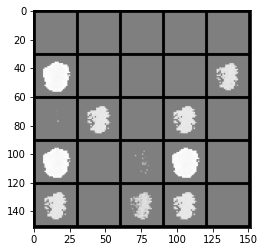

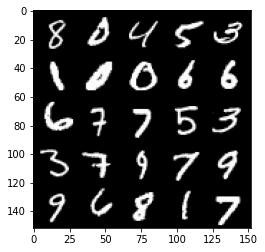

Epoch 120, step 56500: Generator loss: 26.00955079269412, discriminator loss: 5.029141197931963e-11


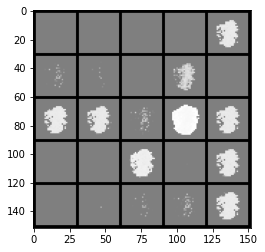

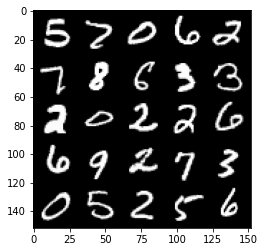

Epoch 121, step 57000: Generator loss: 26.024754360198976, discriminator loss: 5.587934703843444e-11


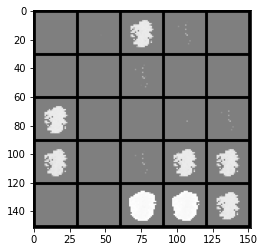

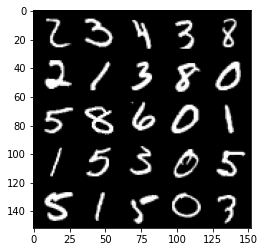

Epoch 122, step 57500: Generator loss: 26.038816818237308, discriminator loss: 4.749744592080772e-11


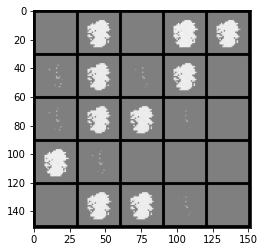

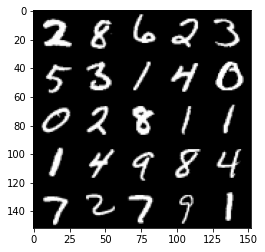

Epoch 123, step 58000: Generator loss: 26.053124881744395, discriminator loss: 4.5634800160954116e-11


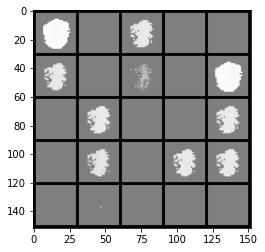

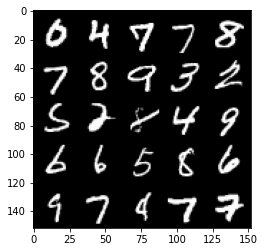

Epoch 124, step 58500: Generator loss: 26.067187637329095, discriminator loss: 4.656612240250268e-11


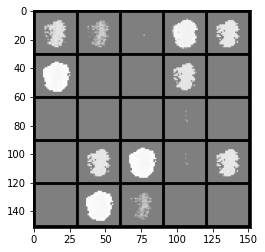

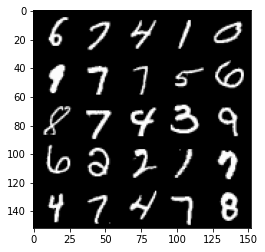

Epoch 125, step 59000: Generator loss: 26.08093734359739, discriminator loss: 4.097818773196594e-11


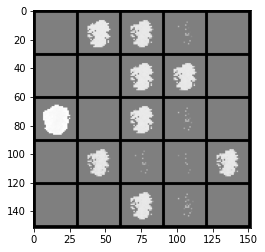

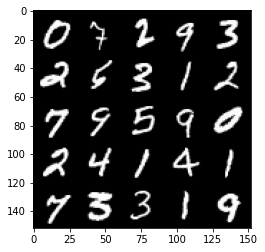

Epoch 126, step 59500: Generator loss: 26.093686954498292, discriminator loss: 4.563480116015484e-11


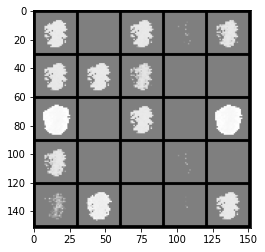

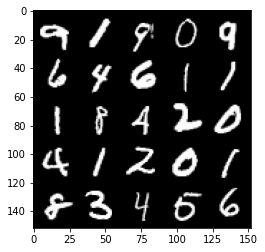

Epoch 127, step 60000: Generator loss: 26.10729599380492, discriminator loss: 4.9360090070837956e-11


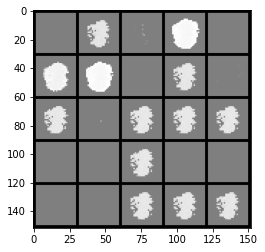

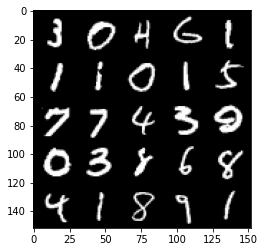

Epoch 128, step 60500: Generator loss: 26.11986833190918, discriminator loss: 4.377215567785697e-11


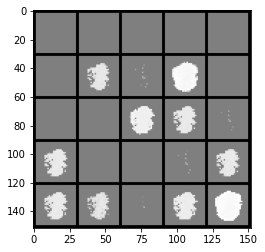

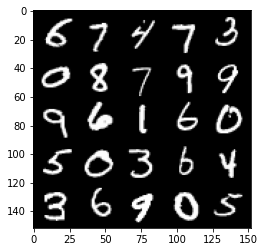

Epoch 130, step 61000: Generator loss: 26.132611446380622, discriminator loss: 4.377215578887928e-11


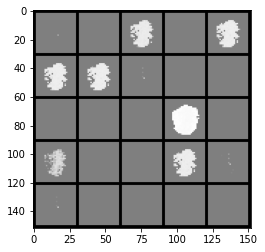

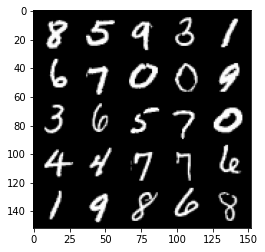

Epoch 131, step 61500: Generator loss: 26.14503168869018, discriminator loss: 4.6566122846591896e-11


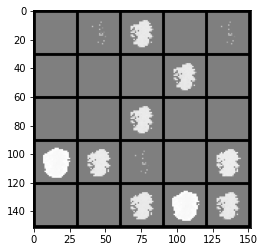

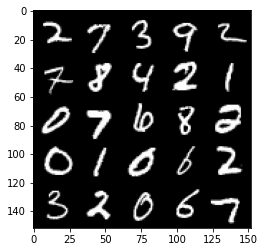

Epoch 132, step 62000: Generator loss: 26.15717221832277, discriminator loss: 3.7252898710260494e-11


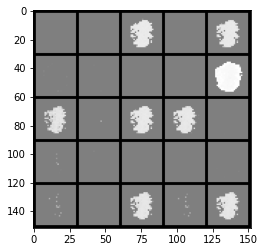

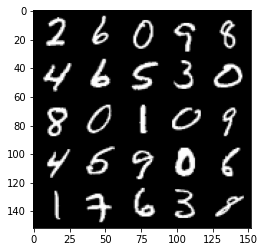

Epoch 133, step 62500: Generator loss: 26.16953680801389, discriminator loss: 4.004686626757348e-11


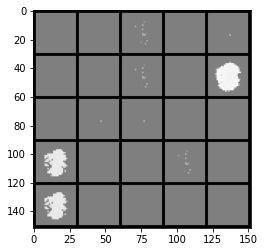

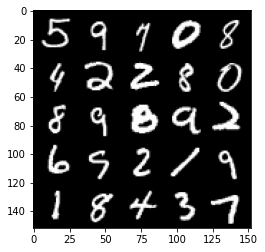

Epoch 134, step 63000: Generator loss: 26.181702857971192, discriminator loss: 3.911554435909181e-11


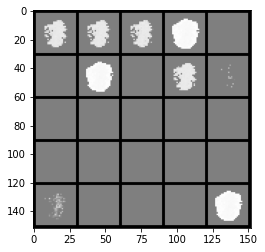

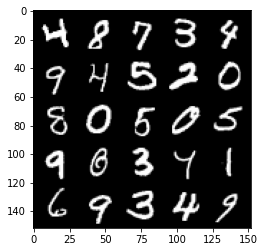

Epoch 135, step 63500: Generator loss: 26.193507251739508, discriminator loss: 4.0978188453610905e-11


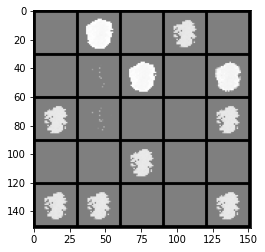

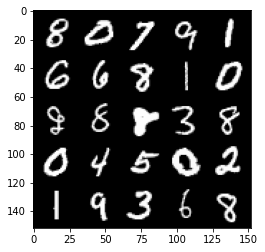

Epoch 136, step 64000: Generator loss: 26.2051065788269, discriminator loss: 4.377215662154654e-11


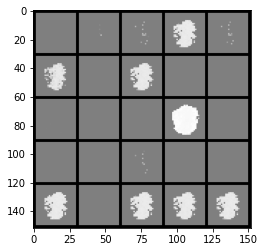

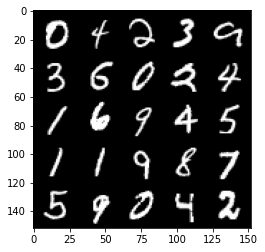

Epoch 137, step 64500: Generator loss: 26.216531295776363, discriminator loss: 3.352760929997701e-11


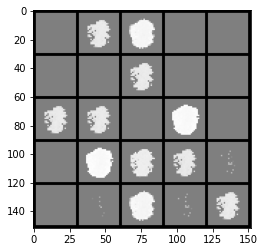

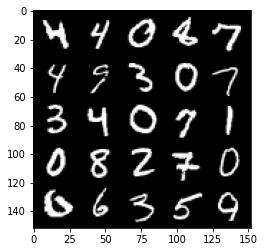

Epoch 138, step 65000: Generator loss: 26.228263221740697, discriminator loss: 3.352760891139895e-11


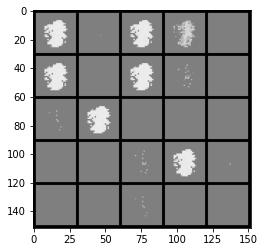

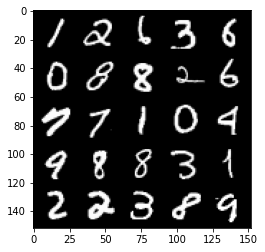

Epoch 139, step 65500: Generator loss: 26.23977489089967, discriminator loss: 3.725289920986085e-11


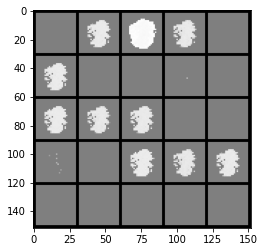

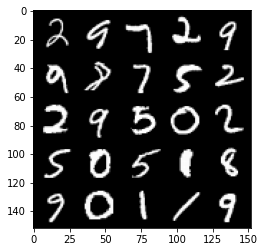

Epoch 140, step 66000: Generator loss: 26.250463005065924, discriminator loss: 4.2840833880397614e-11


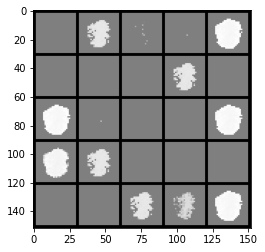

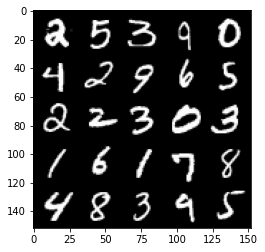

Epoch 141, step 66500: Generator loss: 26.260452480316193, discriminator loss: 3.539025417165221e-11


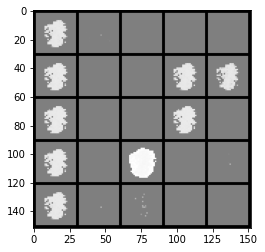

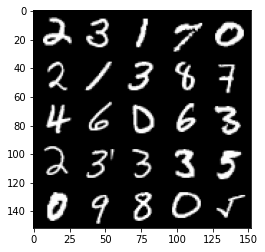

Epoch 142, step 67000: Generator loss: 26.27107807159422, discriminator loss: 3.911554413704721e-11


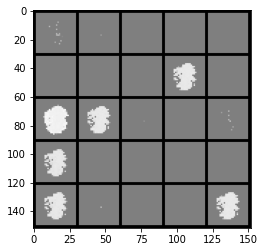

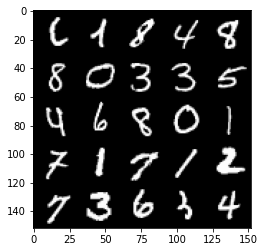

Epoch 143, step 67500: Generator loss: 26.28145294189453, discriminator loss: 3.073364185368633e-11


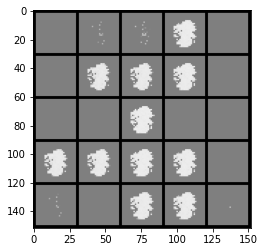

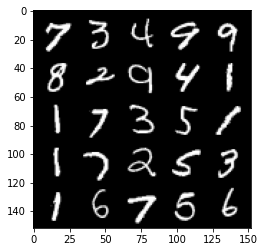

Epoch 144, step 68000: Generator loss: 26.291907218933112, discriminator loss: 3.72528989323051e-11


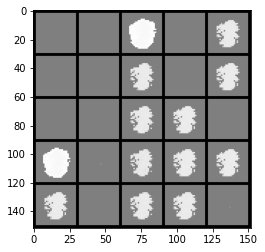

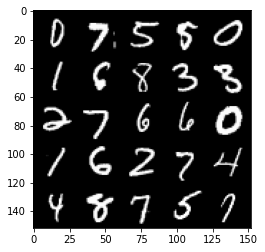

Epoch 146, step 68500: Generator loss: 26.30266118621827, discriminator loss: 3.663201753045797e-11


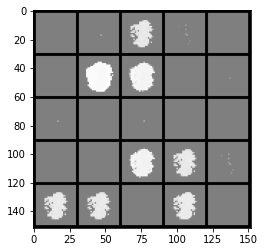

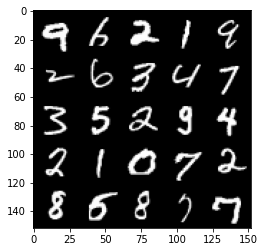

Epoch 147, step 69000: Generator loss: 26.311803558349595, discriminator loss: 4.097818878667781e-11


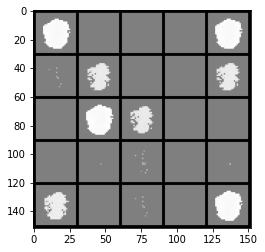

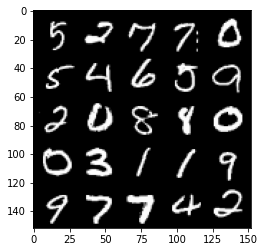

Epoch 148, step 69500: Generator loss: 26.321826744079562, discriminator loss: 2.887099720405574e-11


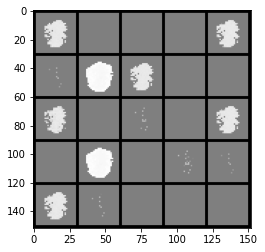

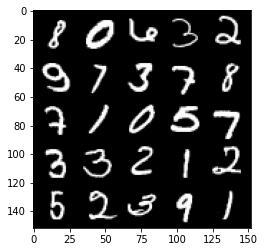

Epoch 149, step 70000: Generator loss: 26.33126735305786, discriminator loss: 3.3527609299977e-11


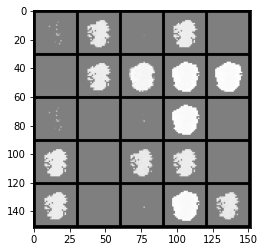

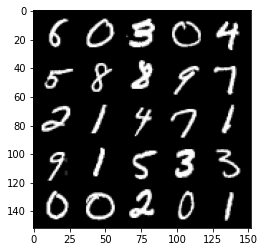

Epoch 150, step 70500: Generator loss: 26.340744297027584, discriminator loss: 2.7939674240862194e-11


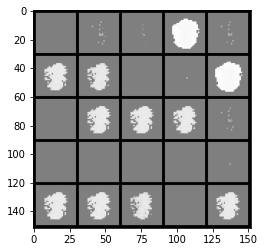

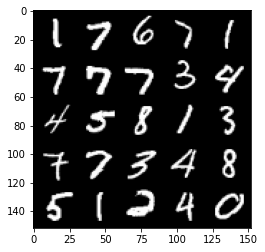

Epoch 151, step 71000: Generator loss: 26.35082410049439, discriminator loss: 3.445893193010364e-11


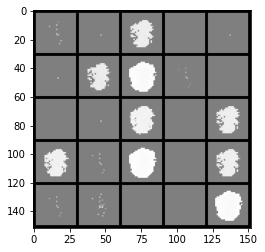

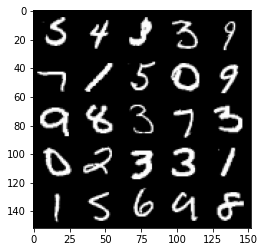

Epoch 152, step 71500: Generator loss: 26.359171543121374, discriminator loss: 4.3772156399501926e-11


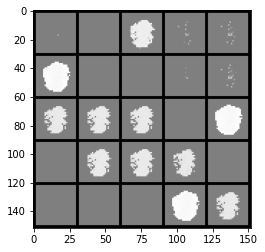

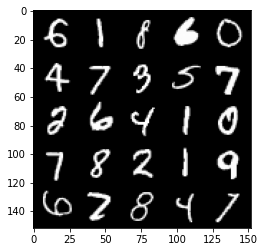

Epoch 153, step 72000: Generator loss: 26.36795125198366, discriminator loss: 2.7008352054824785e-11


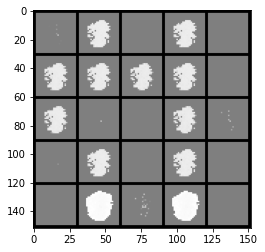

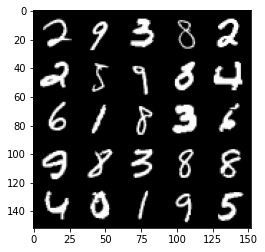

Epoch 154, step 72500: Generator loss: 26.377041198730495, discriminator loss: 3.539025361654069e-11


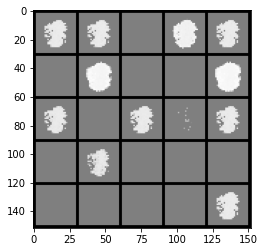

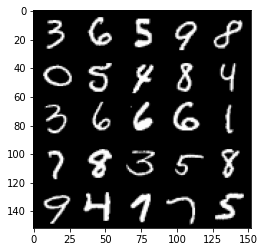

Epoch 155, step 73000: Generator loss: 26.386476570129386, discriminator loss: 2.514570740519418e-11


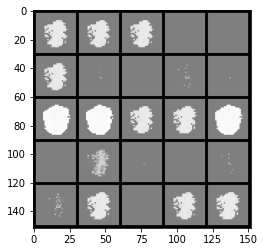

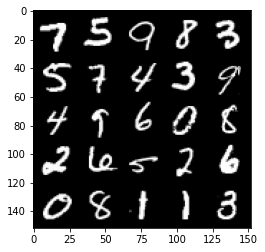

Epoch 156, step 73500: Generator loss: 26.394676181793205, discriminator loss: 3.2596286780872674e-11


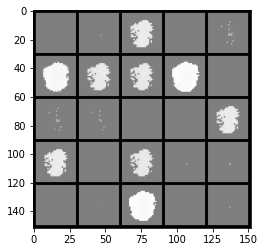

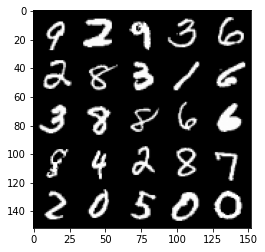

Epoch 157, step 74000: Generator loss: 26.40286668395996, discriminator loss: 2.3283062200452073e-11


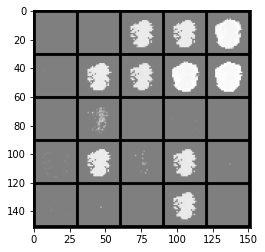

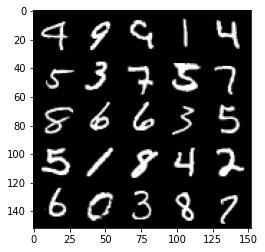

Epoch 158, step 74500: Generator loss: 26.4117035102844, discriminator loss: 2.8870997093033436e-11


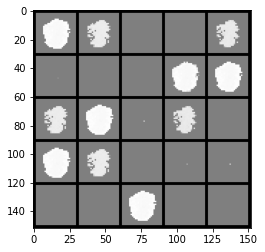

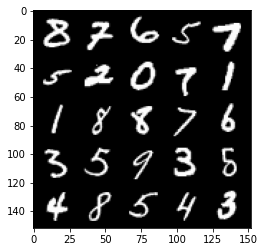

Epoch 159, step 75000: Generator loss: 26.41934823989869, discriminator loss: 3.4458931819081345e-11


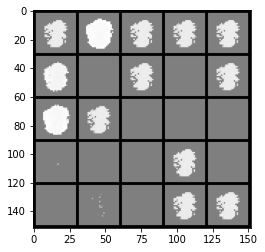

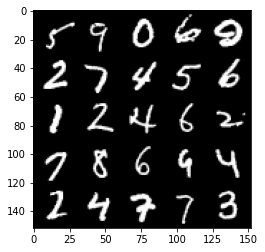

Epoch 160, step 75500: Generator loss: 26.427354122161866, discriminator loss: 2.887099709303344e-11


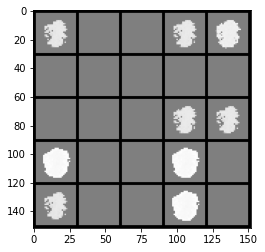

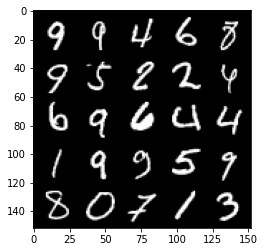

Epoch 162, step 76000: Generator loss: 26.435099246978744, discriminator loss: 2.8870997037522286e-11


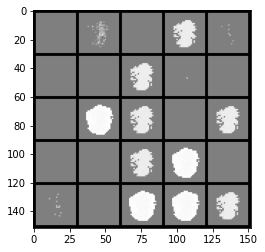

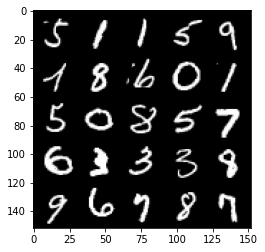

Epoch 163, step 76500: Generator loss: 26.442937637329106, discriminator loss: 2.9802319445604307e-11


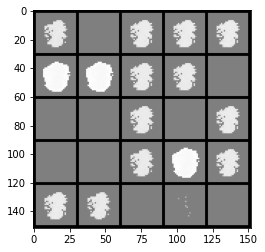

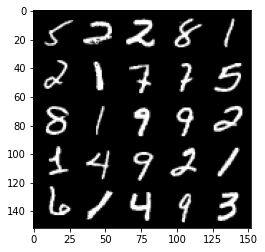

Epoch 164, step 77000: Generator loss: 26.450996856689475, discriminator loss: 2.8870997204055734e-11


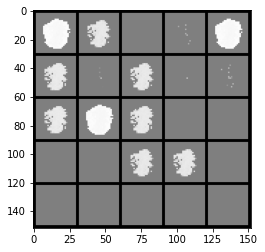

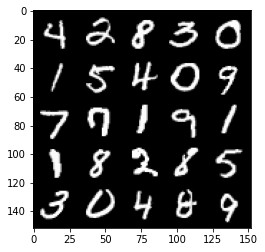

Epoch 165, step 77500: Generator loss: 26.4588953666687, discriminator loss: 2.7008352221358237e-11


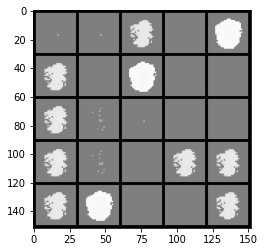

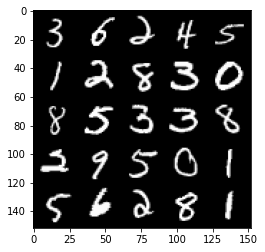

Epoch 166, step 78000: Generator loss: 26.46582314682006, discriminator loss: 3.38380501951896e-11


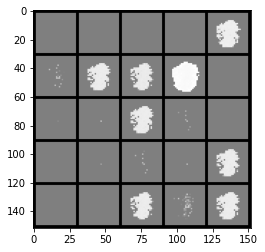

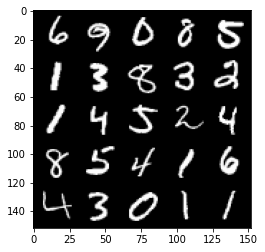

Epoch 167, step 78500: Generator loss: 26.47405127716064, discriminator loss: 1.490116008362463e-11


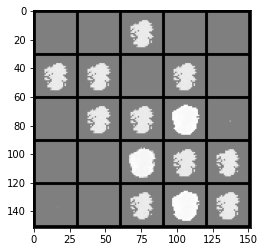

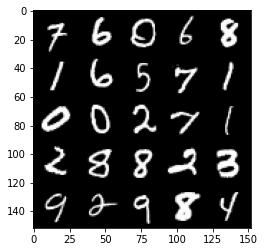

Epoch 168, step 79000: Generator loss: 26.481164409637465, discriminator loss: 3.3527609688555077e-11


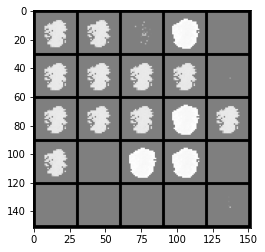

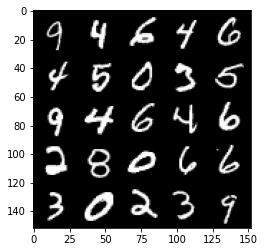

Epoch 169, step 79500: Generator loss: 26.48823520278929, discriminator loss: 2.700835249891399e-11


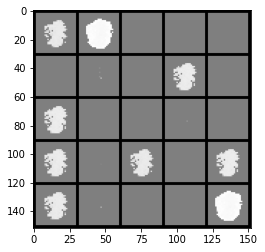

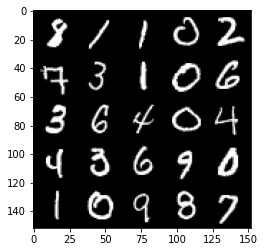

Epoch 170, step 80000: Generator loss: 26.49545626068116, discriminator loss: 2.980231972316006e-11


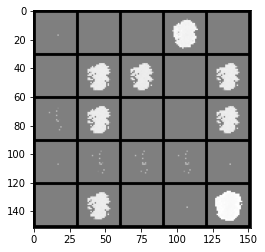

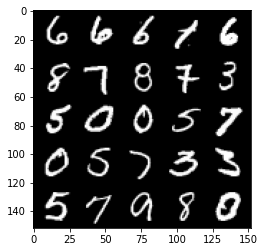

Epoch 171, step 80500: Generator loss: 26.50259828186037, discriminator loss: 2.5145707349683032e-11


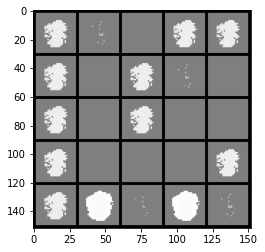

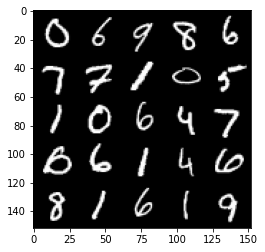

Epoch 172, step 81000: Generator loss: 26.510373504638682, discriminator loss: 1.8936890888721082e-11


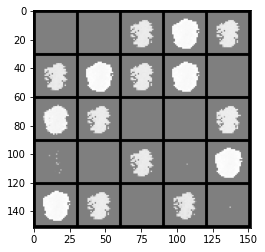

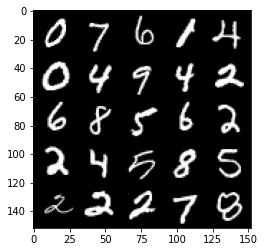

Epoch 173, step 81500: Generator loss: 26.516632480621336, discriminator loss: 3.352760991059967e-11


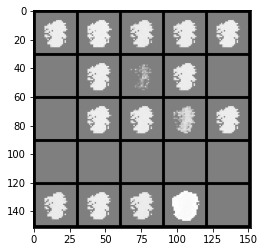

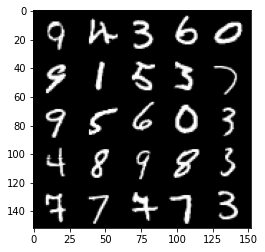

Epoch 174, step 82000: Generator loss: 26.522891166686982, discriminator loss: 2.4214384997112158e-11


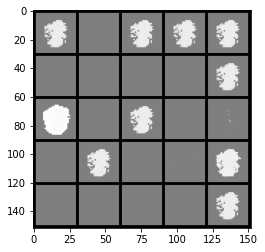

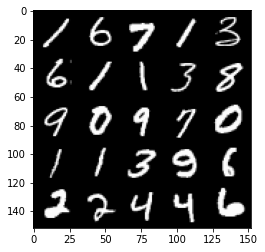

Epoch 175, step 82500: Generator loss: 26.529558506011952, discriminator loss: 2.5145707460705336e-11


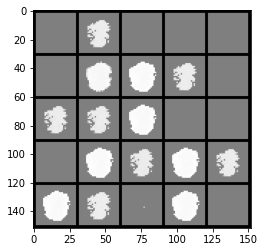

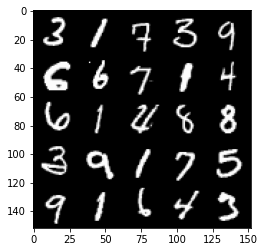

Epoch 176, step 83000: Generator loss: 26.536580680847187, discriminator loss: 2.4214384941601008e-11


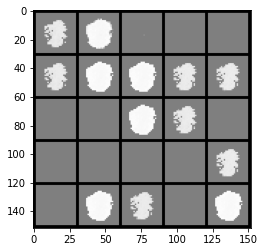

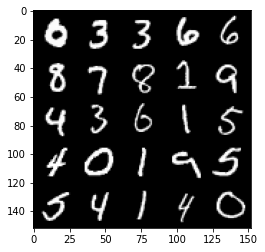

Epoch 178, step 83500: Generator loss: 26.54366857147218, discriminator loss: 2.421438494160101e-11


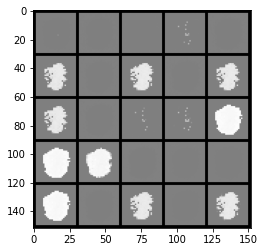

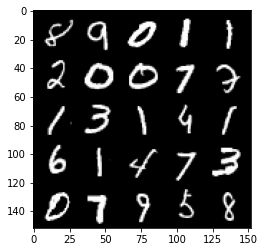

Epoch 179, step 84000: Generator loss: 26.549704189300535, discriminator loss: 2.2351739903392353e-11


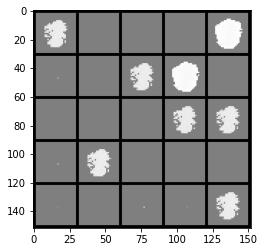

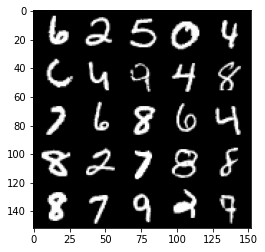

Epoch 180, step 84500: Generator loss: 26.55603249740601, discriminator loss: 2.4214384830578706e-11


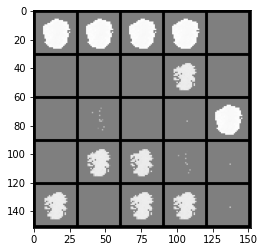

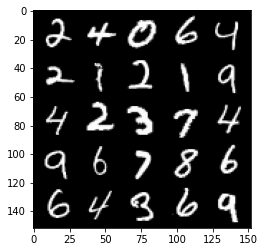

Epoch 181, step 85000: Generator loss: 26.56286687850953, discriminator loss: 2.1420417495310326e-11


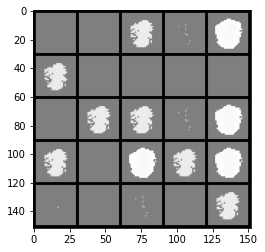

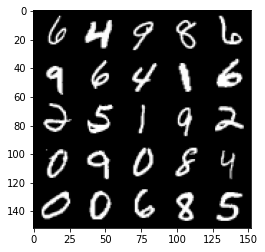

Epoch 182, step 85500: Generator loss: 26.569018245697027, discriminator loss: 2.514570729417188e-11


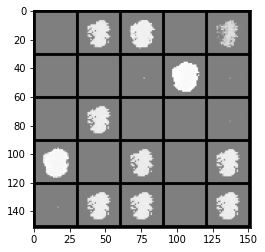

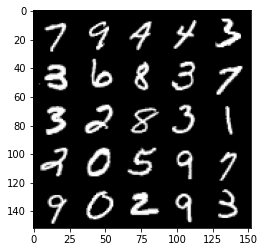

Epoch 183, step 86000: Generator loss: 26.574401008605943, discriminator loss: 2.3283062311474374e-11


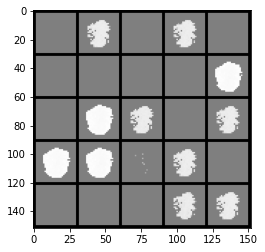

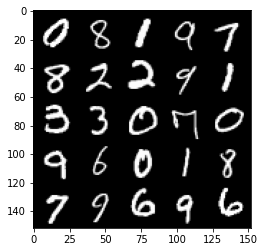

Epoch 184, step 86500: Generator loss: 26.58026275634764, discriminator loss: 1.862645004901964e-11


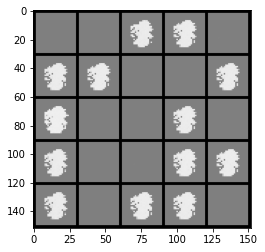

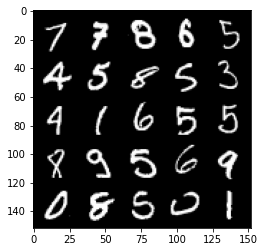

Epoch 185, step 87000: Generator loss: 26.58651634216309, discriminator loss: 2.3283062200452073e-11


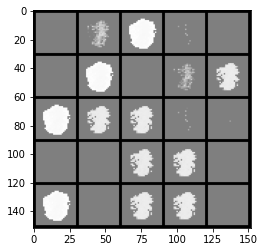

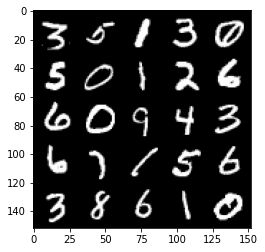

Epoch 186, step 87500: Generator loss: 26.592350719451883, discriminator loss: 1.862644993799734e-11


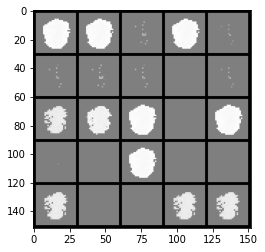

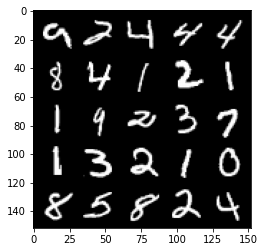

Epoch 187, step 88000: Generator loss: 26.59808794784548, discriminator loss: 2.4214384830578703e-11


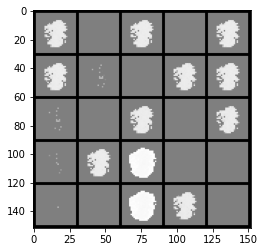

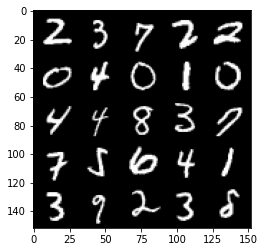

Epoch 188, step 88500: Generator loss: 26.604189102172832, discriminator loss: 1.3038514823371374e-11


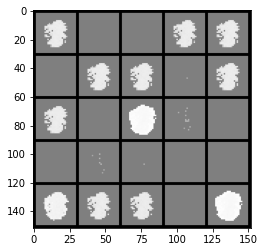

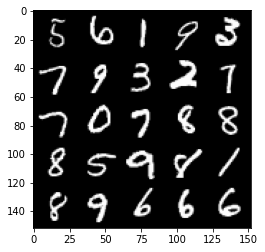

Epoch 189, step 89000: Generator loss: 26.610080467224158, discriminator loss: 1.769512775195992e-11


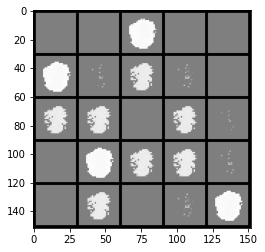

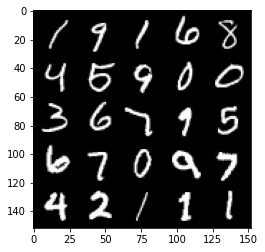

Epoch 190, step 89500: Generator loss: 26.615863903045653, discriminator loss: 1.769512730787071e-11


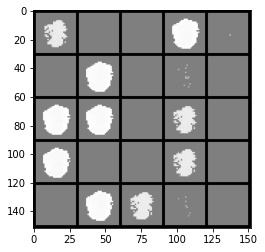

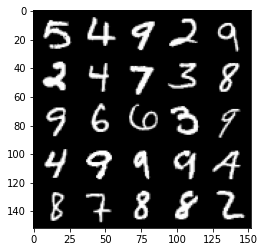

Epoch 191, step 90000: Generator loss: 26.621892810821528, discriminator loss: 2.2351739792370043e-11


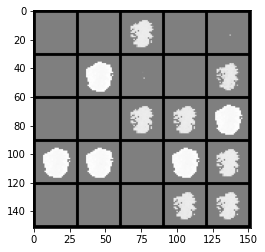

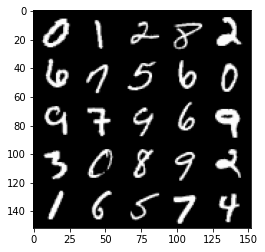

Epoch 192, step 90500: Generator loss: 26.627812889099122, discriminator loss: 1.769512741889301e-11


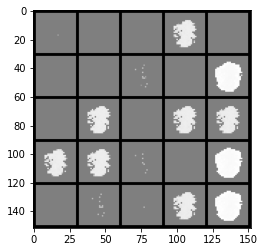

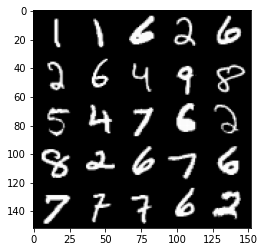

Epoch 194, step 91000: Generator loss: 26.632793865203887, discriminator loss: 1.862644993799734e-11


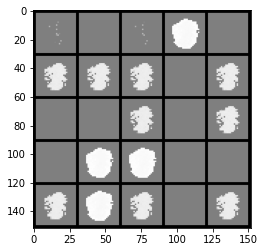

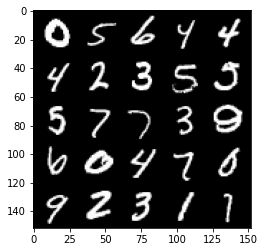

Epoch 195, step 91500: Generator loss: 26.63782006072995, discriminator loss: 2.2351739903392353e-11


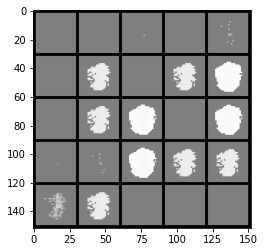

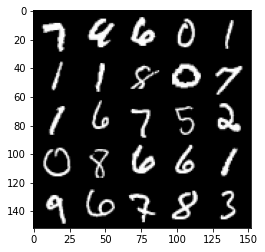

Epoch 196, step 92000: Generator loss: 26.643581790924067, discriminator loss: 1.6763804899788683e-11


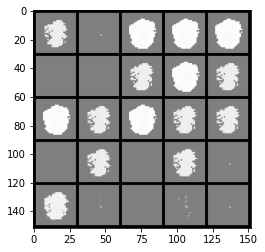

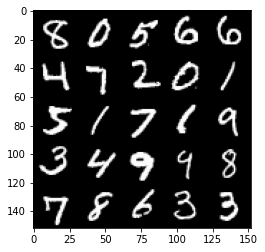

Epoch 197, step 92500: Generator loss: 26.648342128753697, discriminator loss: 1.7695127529915316e-11


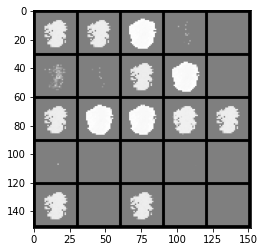

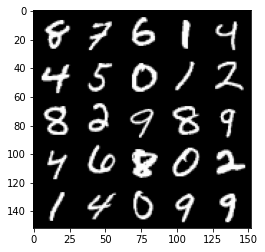

Epoch 198, step 93000: Generator loss: 26.65359652328494, discriminator loss: 1.7695127307870707e-11


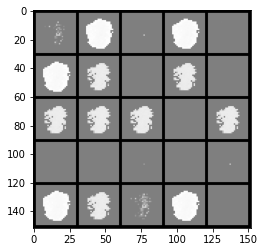

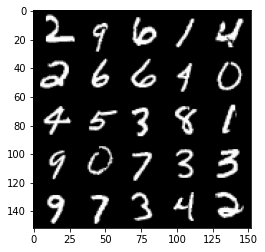

Epoch 199, step 93500: Generator loss: 26.658905807495135, discriminator loss: 2.4214385052623312e-11


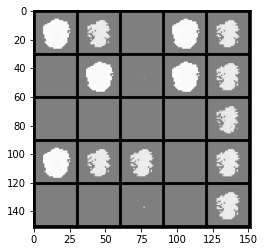

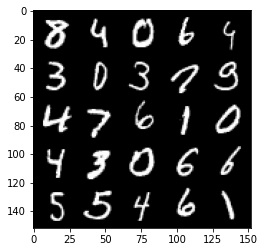

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()


        ### Update generator ###
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
       
        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
